# Explainer examples

This notebook shows how you can use the `Explainer` object for interactive visualization in your jupyter notebook.

All this plotting functionality gets called by the `ExplainerDashboard` to construct the interactive dashboard.

# Imports

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [3]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score

In [4]:
from explainerdashboard.explainers import *
from explainerdashboard.datasets import *

# ClassifierExplainer:

In [5]:
X_train, y_train, X_test, y_test = titanic_survive()
train_names, test_names = titanic_names()

feature_descriptions = {
    "Sex": "Gender of passenger",
    "Deck": "The deck the passenger had their cabin on",
    "PassengerClass": "The class of the ticket: 1st, 2nd or 3rd class",
    "Fare": "The amount of money people paid", 
    "No_of_relatives_on_board": "number of siblings, spouses, parents plus children on board",
    "Embarked": "the port where the passenger boarded the Titanic. Either Southampton, Cherbourg or Queenstown",
    "Age": "Age of the passenger",
    "No_of_siblings_plus_spouses_on_board": "The sum of the number of siblings plus the number of spouses on board",
    "No_of_parents_plus_children_on_board" : "The sum of the number of parents plus the number of children on board",
}

In [6]:
model = RandomForestClassifier(n_estimators=50, max_depth=5)
model.fit(X_train, y_train)

explainer = ClassifierExplainer(model, X_test, y_test, 
                                cats=['Sex', 'Deck', 'Embarked'],
                                idxs=test_names, #names of passengers 
                                descriptions=feature_descriptions,
                                labels=['Not survived', 'Survived'])


RandomForestClassifier(max_depth=5, n_estimators=50)

Note: shap=='guess' so guessing for RandomForestClassifier shap='tree'...
Note: model_output=='probability', so assuming that raw shap output of RandomForestClassifier is in probability space...
Generating self.shap_explainer = shap.TreeExplainer(model)
Note: You can always monkeypatch self.shap_explainer if desired...


## Importances

In [7]:
explainer.mean_abs_shap_df(cats=True, cutoff=0.01)

Calculating shap values...


,Feature,MEAN_ABS_SHAP
0,Sex,0.183655
1,Deck,0.052965
2,PassengerClass,0.046405
3,Fare,0.029657
4,Embarked,0.018246
5,No_of_relatives_on_board,0.015698
6,Age,0.014793


In [8]:
explainer.permutation_importances_df(cats=False, topx=12)

Calculating importances...


,Feature,Importance
0,Fare,-0.005825
1,No_of_relatives_on_board,-0.009222
2,Age,-0.007766
3,PassengerClass,0.028422
4,No_of_siblings_plus_spouses_on_board,-0.005447
5,No_of_parents_plus_children_on_board,-0.001726
6,Sex_female,0.012350
7,Sex_male,0.067576
8,Sex_nan,0.000000
9,Deck_A,0.000000


### Mean absolute shap importances, grouping onehotencoded:

In [9]:
explainer.plot_importances(kind='shap', topx=5, cats=True, round=3)

### Permutation importances, not grouping categorical vars, showing top 10

In [10]:
explainer.plot_importances(kind='permutation', topx=10, cats=False, round=3)

## detailed shap summary

In [11]:
explainer.plot_shap_summary(topx=10, cats=True)

In [12]:
explainer.plot_shap_summary(topx=None, cats=False)

## interaction importances

### mean absolute shap interaction values for interactions with 'Sex' 
- the direct effect is usually the largest
- in this case PassengerClass shows the biggest interaction with gender

In [13]:
explainer.plot_interactions('Sex', cats=True, topx=5)

Calculating shap interaction values...


In [14]:
explainer.plot_interactions('Fare', cats=False, topx=5)

### Detailed shap interactions summary:

In [16]:
explainer.plot_shap_interaction_summary("Sex")

## Contributions

In [17]:
index = 0 # explain prediction for first row of X_test
explainer.contrib_df(index, cats=True, topx=8)

,col,contribution,value,cumulative,base
0,base_value,0.393922,-,0.393922,0.000000
1,Sex,0.254159,female,0.648080,0.393922
2,PassengerClass,0.077369,1,0.725449,0.648080
3,Deck,0.053512,C,0.778961,0.725449
4,Fare,0.047252,71.2833,0.826214,0.778961
5,Embarked,0.035673,Cherbourg,0.861886,0.826214
6,Age,-0.015130,38,0.846756,0.861886
7,No_of_relatives_on_board,0.014798,1,0.861554,0.846756
8,REST,0.001849,-,0.863403,0.861554


In [18]:
explainer.plot_shap_contributions(index, cats=True, topx=8, round=2)

In [19]:
name = test_names[0] # explainer prediction for name
print(name)
explainer.plot_shap_contributions(name, cats=False)

Cumings, Mrs. John Bradley (Florence Briggs Thayer)


## Shap dependence plots

In [20]:
explainer.plot_shap_dependence("Age")

### color by sex

In [23]:
explainer.plot_shap_dependence("Age", color_col="Sex")

### color by Fare

In [24]:
explainer.plot_shap_dependence("Age", color_col="Fare")

### Highlight particular index

In [27]:

explainer.plot_shap_dependence("Age", color_col="Sex", highlight_idx=5)

## Shap interactions plots

In [29]:
explainer.plot_shap_interaction("Sex", "PassengerClass")

In [30]:
explainer.plot_shap_interaction("PassengerClass", "Sex")

In [31]:
explainer.plot_shap_interaction("Fare", "Age", highlight_idx=5)

In [32]:
explainer.plot_shap_interaction("Age", "Fare")

## partial dependence plots (pdp)

### Plot average general partial dependence plot with ice lines for specific observations

In [33]:
explainer.plot_pdp("Fare")

In [34]:
explainer.plot_pdp("Sex")

### highlight pdp for specific observation

In [35]:
name = test_names[5]
print(name)
explainer.plot_pdp("Fare", name)

Saundercock, Mr. William Henry
Calculating prediction probabilities...


### with default parameters:

In [36]:
explainer.plot_pdp("Age", index=5, drop_na=True, sample=100,
                    num_grid_lines=100, num_grid_points=10)

### adjusting parameters:

- `drop_na=False` no longer drop values equal to self.na_fill (-999 by default)
- `sample=200` sample 200 samples for calculating the average
- `num_grid_lines=10`  display 10 additional grid lines
- `num_grid_points=50` take 50 points along the x axis to calculate the lines

In [37]:
explainer.plot_pdp("Age", index=5, drop_na=False, sample=200,
                    num_grid_lines=10, num_grid_points=50)

## Classification validation plots:

In [38]:
explainer.metrics(cutoff=0.8)

{'accuracy': 0.75,
 'precision': 1.0,
 'recall': 0.3150684931506849,
 'f1': 0.4791666666666667,
 'roc_auc_score': 0.8778448926760867,
 'pr_auc_score': 0.8595453846805217,
 'log_loss': 0.4137737561908004}

In [39]:
from IPython.display import display, Markdown
display(Markdown(explainer.prediction_result_markdown(test_names[3])))

Calculating pred_percentiles...


# Prediction for Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg):
##### Not survived: 51.25 
##### Survived: 48.75 
##### Actual Outcome: Survived

##### In top 32.0% percentile probability Survived

### confusion matrix

In [40]:
explainer.plot_confusion_matrix(cutoff=0.5, normalized=False, binary=True)

#### For multiclass classifiers, `binary=False` would display e.g. a 3x3 confusion matrix
- in this case it's a binary classifier, so binary=False makes no difference

In [41]:
explainer.plot_confusion_matrix(cutoff=0.5, normalized=True, binary=False)

### precision plot
- if the classifier works well the predicted probability should be the same as the observed probability per bin, so we would expect a nice straight line from 0 to 1

#### based on bin size:

In [42]:
explainer.plot_precision(bin_size=0.1)

#### based on quantiles, showing all classes, adding in a cutoff value

In [43]:
explainer.plot_precision(quantiles=10, cutoff=0.75, multiclass=True)

### Cumulative precision

In [44]:
explainer.plot_cumulative_precision()

### lift curve

In [45]:
explainer.plot_lift_curve(cutoff=None, percentage=False, round=2)

In [46]:
explainer.plot_lift_curve(cutoff=0.75, percentage=True, round=2)

### Plot classification:

In [47]:
explainer.plot_classification()

In [48]:
explainer.plot_classification(cutoff=0.75, percentage=False)

### ROC AUC Curve

In [49]:
explainer.plot_roc_auc(cutoff=0.75)

### Plot PR AUC

In [50]:
explainer.plot_pr_auc(cutoff=0.25)

# RegressionExplainer

In [51]:
X_train, y_train, X_test, y_test = titanic_fare()
train_names, test_names = titanic_names()

feature_descriptions = {
    "Sex": "Gender of passenger",
    "Deck": "The deck the passenger had their cabin on",
    "PassengerClass": "The class of the ticket: 1st, 2nd or 3rd class",
    "Fare": "The amount of money people paid", 
    "No_of_relatives_on_board": "number of siblings, spouses, parents plus children on board",
    "Embarked": "the port where the passenger boarded the Titanic. Either Southampton, Cherbourg or Queenstown",
    "Age": "Age of the passenger",
    "No_of_siblings_plus_spouses_on_board": "The sum of the number of siblings plus the number of spouses on board",
    "No_of_parents_plus_children_on_board" : "The sum of the number of parents plus the number of children on board",
}

In [52]:
from sklearn.ensemble import RandomForestRegressor
model = RandomForestRegressor(n_estimators=50, max_depth=5)
model.fit(X_train, y_train)

explainer = RegressionExplainer(model, X_test, y_test, 
                                cats=['Sex', 'Deck', 'Embarked'], 
                                idxs=test_names, 
                                units="$")

RandomForestRegressor(max_depth=5, n_estimators=50)

Note: shap=='guess' so guessing for RandomForestRegressor shap='tree'...
Generating self.shap_explainer = shap.TreeExplainer(model)


## Importances

### Mean absolute shap importances, grouping onehotencoded:

In [53]:
explainer.plot_importances(kind='shap', topx=5, cats=True, round=3)

Calculating shap values...


### Permutation importances, not grouping categorical vars, showing top 10

In [54]:
explainer.plot_importances(kind='permutation', topx=10, cats=False, round=3)

Calculating importances...


## detailed shap summary

In [55]:
explainer.plot_shap_summary(topx=10, cats=True)

Calculating shap values...


In [56]:
explainer.plot_shap_summary(topx=None, cats=False)

## interaction importances

### mean absolute shap interaction values for interactions with 'Sex' 
- the direct effect is usually the largest
- in this case PassengerClass shows the biggest interaction with gender

In [57]:
explainer.plot_interactions('Sex', cats=True, topx=5)

Calculating shap interaction values...
Calculating shap interaction values...


In [58]:
explainer.plot_interactions('Age', cats=False, topx=5)

### Detailed shap interactions summary:

In [59]:
explainer.plot_shap_interaction_summary("Sex", cats=True)

TypeError: plot_shap_interaction_summary() got an unexpected keyword argument 'cats'

## Contributions

In [60]:
index = 0 # explain prediction for first row of X_test
explainer.plot_shap_contributions(index, cats=True, topx=8, round=2)

In [61]:
name = test_names[0] # explainer prediction for name
print(name)
explainer.plot_shap_contributions(name, cats=False)

Cumings, Mrs. John Bradley (Florence Briggs Thayer)


## Shap dependence plots

In [62]:
explainer.plot_shap_dependence("Age")

### color by sex

In [63]:
explainer.plot_shap_dependence("Age", color_col="Sex")

### color by PassengerClass

In [64]:
explainer.plot_shap_dependence("Age", color_col="PassengerClass")

### Highlight particular index

In [65]:

explainer.plot_shap_dependence("Age", color_col="Sex", highlight_idx=5)

## Shap interactions plots

In [66]:
explainer.plot_shap_interaction("Sex", "PassengerClass")

In [67]:
explainer.plot_shap_interaction("PassengerClass", "Sex")

In [68]:
explainer.plot_shap_interaction("PassengerClass", "Age", highlight_idx=5)

In [69]:
explainer.plot_shap_interaction("Age", "PassengerClass")

## partial dependence plots (pdp)

### Plot average general partial dependence plot with ice lines for specific observations

In [70]:
explainer.plot_pdp("PassengerClass")

In [71]:
explainer.plot_pdp("Deck")

### highlight pdp for specific observation

In [72]:
name = test_names[17]
print(name)
explainer.plot_pdp("PassengerClass", name)

Hood, Mr. Ambrose Jr
Calculating predictions...


### with default parameters:

In [73]:
explainer.plot_pdp("PassengerClass", index=17, drop_na=True, sample=100,
                    num_grid_lines=100, num_grid_points=10)

### adjusting parameters:

- `drop_na=False` no longer drop values equal to self.na_fill (-999 by default)
- `sample=200` sample 200 samples for calculating the average
- `num_grid_lines=10`  display 10 additional grid lines
- `num_grid_points=50` take 50 points along the x axis to calculate the lines

In [74]:
explainer.plot_pdp("PassengerClass", index=17, drop_na=False, sample=200,
                    num_grid_lines=10, num_grid_points=50)

## Regression validation plots:

In [75]:
explainer.metrics()

{'rmse': 27.62782918100262,
 'mae': 12.600097314134114,
 'R2': 0.47757932730550523}

In [76]:
from IPython.display import display, Markdown
display(Markdown(explainer.prediction_result_markdown(test_names[3])))

# Prediction for Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg):
##### Prediction: 17.76
##### Actual Outcome: 11.13

### predicted vs actual

In [77]:
explainer.plot_predicted_vs_actual()

In [78]:
explainer.plot_predicted_vs_actual(logs=True)

## plot residuals

In [79]:
explainer.plot_residuals()

In [80]:
explainer.plot_residuals(vs_actual=True)

In [81]:
explainer.plot_residuals(ratio=True)

## residuals vs specific feature

In [82]:
explainer.plot_residuals_vs_feature("Age")

# RandomForestExplainer

`RandomForestClassifierExplainer`. and `RandomForestRegressionExplainer`, provide some additional functionality to visualize the individual trees in the RandomForest.

In [83]:
X_train, y_train, X_test, y_test = titanic_survive()
train_names, test_names = titanic_names()

feature_descriptions = {
    "Sex": "Gender of passenger",
    "Deck": "The deck the passenger had their cabin on",
    "PassengerClass": "The class of the ticket: 1st, 2nd or 3rd class",
    "Fare": "The amount of money people paid", 
    "No_of_relatives_on_board": "number of siblings, spouses, parents plus children on board",
    "Embarked": "the port where the passenger boarded the Titanic. Either Southampton, Cherbourg or Queenstown",
    "Age": "Age of the passenger",
    "No_of_siblings_plus_spouses_on_board": "The sum of the number of siblings plus the number of spouses on board",
    "No_of_parents_plus_children_on_board" : "The sum of the number of parents plus the number of children on board",
}

from sklearn.ensemble import RandomForestRegressor
model = RandomForestClassifier(n_estimators=50, max_depth=5)
model.fit(X_train, y_train)

explainer = RandomForestClassifierExplainer(model, X_test, y_test, 
                                cats=['Sex', 'Deck', 'Embarked'], 
                                idxs=test_names)

RandomForestClassifier(max_depth=5, n_estimators=50)

Note: shap=='guess' so guessing for RandomForestClassifier shap='tree'...
Note: model_output=='probability', so assuming that raw shap output of RandomForestClassifier is in probability space...
Generating self.shap_explainer = shap.TreeExplainer(model)
Note: You can always monkeypatch self.shap_explainer if desired...


In [84]:
name = test_names[20]
print(name)# first row of X_test
explainer.plot_trees(name, highlight_tree=20)

Christmann, Mr. Emil


In [85]:
explainer.decisiontree_df(tree_idx=20, index=name)

Generating ShadowDecTree for each individual decision tree...


,node_id,average,feature,value,split,direction,left,right,diff
0,0,0.399421,Deck_Unkown,1.00,0.500000,right,0.666667,0.317580,-0.081841
1,24,0.317580,Fare,8.05,76.174999,left,0.305019,0.909091,-0.012561
2,25,0.305019,Embarked_Southamption,1.00,0.500000,right,0.446970,0.256477,-0.048543
3,33,0.256477,No_of_relatives_on_board,0.00,0.500000,left,0.212598,0.340909,-0.043878
4,34,0.212598,Sex_male,1.00,0.500000,right,0.553191,0.135266,-0.077333


In [86]:
base_value, prediction, decisiontree_df = explainer.decisiontree_df_summary(tree_idx=5, index=name)
print(f"base value: {base_value}, final prediction: {prediction}")
decisiontree_df

base value: 39.8, final prediction: 13.08


,value,condition,change,prediction
0,Fare=8.05 ...,< 74.375,-6.03%,33.77%
1,Embarked_Southamption=1.0 ...,>=0.5,-4.2%,29.57%
2,Deck_Unkown=1.0 ...,>=0.5,-3.61%,25.96%
3,No_of_siblings_plus_spouses_on_board=0.0 ...,< 1.5,+1.75%,27.71%
4,Sex_female=0.0 ...,< 0.5,-14.64%,13.08%


## decision_path
- this graphic is generated by dtreeviz
- See https://explained.ai/decision-tree-viz/index.html for more of the thinking behind this visualization
- dtreeviz generates an SVG gile that gets saved to disk
- but you need a working installation of graphviz for this to work
- Would be nice to turn this into a react component!


20


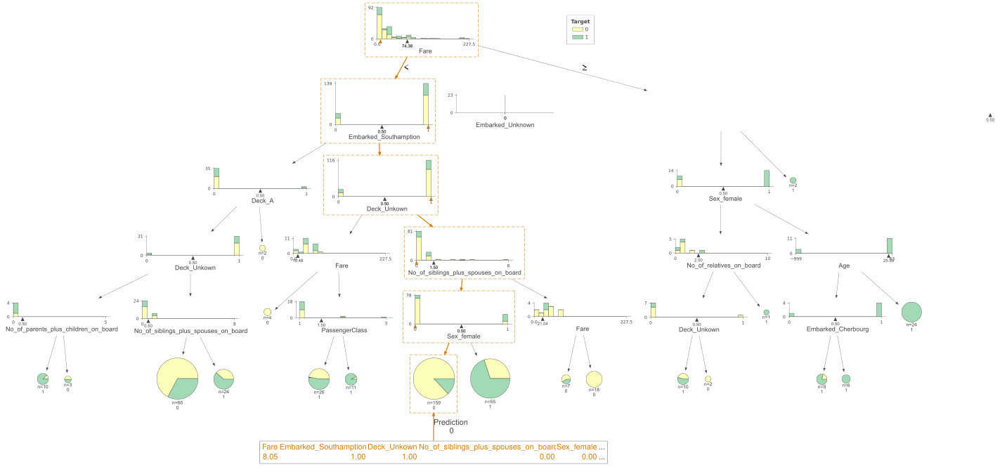

In [87]:
explainer.decision_path(tree_idx=5, index=name)